In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix as cm
from mlxtend.plotting import plot_decision_regions

In [2]:
warnings.filterwarnings('ignore')

## Notebook Overview

For this project, I applied data mining techniques to a dataset consisting of pre-draft metrics and statistics for NBA players to determine whether or not it was possible to create accurate models that could predict whether or not an NBA prospect would develop into a future All-Star.

This notebook contains the analysis performed to develop Logistic Regression and Support Vector Machine (SVM) models with this goal in mind.

For each model, hypothetical players numbered from 1-4 are supplied to test predictions into whether or not the model believes that they could develop into All-Stars or not. Players 1 and 2 represent Backcourt players (Point Guards and Shooting Guards), and Players 3 and 4 represent Frontcourt players (Small Forwards, Power Forwards, and Centers). These players are to be thought of as prospects that are up to be drafted into the NBA, and we as the user are to think of ourselves as GMs assessing them through our trained models.

## Loading the Data

In [3]:
data = 'C://Users//micha//Documents//DMII_Final_Project//draft_dataset.csv'

In [4]:
df_nba=pd.read_csv(data)

In [5]:
df_nba.head()

,Player,All_Star,Position,BC/FC,Height_No_Shoes,Height_Shoes,Wingspan,Standing_Reach,Vertical_Max,Vertical_Max_Reach,Vertical_No_Step,Vertical_No_Step_Reach,Weight,Reach_Height_Ratio,Wingspan_Height_Ratio,BMI,PTS,REB,AST,TPV
0,Dante Exum,0,PG,BC,77,78,82,103,35,138,32,135,196.0,1.32,1.05,23.5,2.7,1.5,2.0,8.8
1,Marcus Moore,0,SG,BC,76,77,81,102,30,132,25,127,202.0,1.32,1.05,24.6,3.3,2.5,0.3,6.4
2,DeAndre Liggins,0,SG,BC,77,78,83,104,31,135,27,131,202.0,1.33,1.06,24.0,5.8,3.0,2.1,13.6
3,Monte Morris,0,PG,BC,73,75,76,97,34,130,28,125,175.0,1.29,1.01,22.9,6.8,2.6,3.7,17.9
4,Kendall Marshall,0,PG,BC,75,76,78,96,37,133,31,127,198.0,1.26,1.03,24.6,7.2,2.3,8.0,28.0


In [6]:
df_nba.tail()

,Player,All_Star,Position,BC/FC,Height_No_Shoes,Height_Shoes,Wingspan,Standing_Reach,Vertical_Max,Vertical_Max_Reach,Vertical_No_Step,Vertical_No_Step_Reach,Weight,Reach_Height_Ratio,Wingspan_Height_Ratio,BMI,PTS,REB,AST,TPV
599,Elvin Hayes,1,PF,FC,80,81,84,106,34,140,30,136,235.0,1.31,1.04,25.8,31.0,17.2,1.4,50.9
600,Elgin Baylor,1,SF,FC,76,77,80,101,38,139,34,135,225.0,1.31,1.04,27.4,31.2,19.8,3.8,59.2
601,LeBron James,1,SF,FC,79,81,84,106,44,150,39,145,245.0,1.31,1.04,27.4,31.6,9.6,4.6,51.6
602,Spencer Haywood,1,PF,FC,79,80,85,106,36,142,32,138,230.0,1.33,1.06,25.9,32.2,22.1,3.4,61.5
603,Moses Malone,1,C,FC,81,82,86,110,35,145,30,140,215.0,1.34,1.05,23.0,36.0,26.0,1.5,64.6


In the context of this dataset, a "0" indicates that a player has never been named an All-Star, while a "1" indicates that a player has been named an All-Star.

In [7]:
df_nba.shape

(604, 20)

## Checking for nulls

In [8]:
df_nba.isnull().sum()

Player                    0
All_Star                  0
Position                  0
BC/FC                     0
Height_No_Shoes           0
Height_Shoes              0
Wingspan                  0
Standing_Reach            0
Vertical_Max              0
Vertical_Max_Reach        0
Vertical_No_Step          0
Vertical_No_Step_Reach    0
Weight                    0
Reach_Height_Ratio        0
Wingspan_Height_Ratio     0
BMI                       0
PTS                       0
REB                       0
AST                       0
TPV                       0
dtype: int64

As we can see, we have no nulls entries in any of our columns.

## Next, let's take a look at our dataset's balance with respect to our target classes

In [9]:
all_star_counts = df_nba['All_Star'].value_counts()

print(all_star_counts)

0    302
1    302
Name: All_Star, dtype: int64


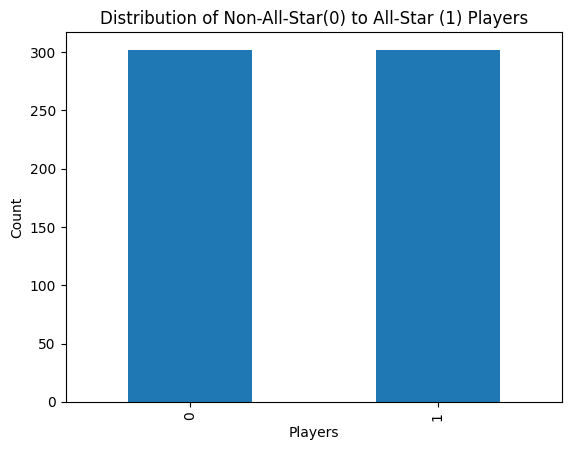

In [10]:
all_star_counts.plot(kind='bar')
plt.title("Distribution of Non-All-Star(0) to All-Star (1) Players")
plt.xlabel("Players")
plt.ylabel("Count");

As we can see, distribution of All-Stars to Non-All-Stars is equal.

## Now with respect to our target classes and position

In [11]:
positions = ['PG', 'SG', 'SF', 'PF', 'C']

for position in positions:
    players_by_position = df_nba[df_nba['Position'] == position]
    
    all_star_counts = players_by_position['All_Star'].value_counts()
    
    print(f"{position}s:")
    print("All Stars:", all_star_counts[1])
    print("Non-All Stars:", all_star_counts[0])
    print()

PGs:
All Stars: 54
Non-All Stars: 54

SGs:
All Stars: 65
Non-All Stars: 65

SFs:
All Stars: 57
Non-All Stars: 57

PFs:
All Stars: 74
Non-All Stars: 74

Cs:
All Stars: 52
Non-All Stars: 52



## Lastly, with respect to our target classes and whether or not a player's position is considered part of the Backcourt or Frontcourt.

In [12]:
bc_fcs = ['BC', 'FC']

for bc_fc in bc_fcs:
    players_by_bc_fc = df_nba[df_nba['BC/FC'] == bc_fc]
    
    all_star_counts = players_by_bc_fc['All_Star'].value_counts()
    
    print(f"{bc_fc}s:")
    print("All Stars:", all_star_counts[1])
    print("Non-All Stars:", all_star_counts[0])
    print()

BCs:
All Stars: 119
Non-All Stars: 119

FCs:
All Stars: 183
Non-All Stars: 183



## - Balance Check Complete -

## Separating Backcourt and Frontcourt into Two New Dataframes

Next, in order for the dataset to be mined for proper insights, it is important to create two separate dataframes that reflect data for Backcourt and Frontcourt players. The reason for this is that qualities that make a great Backcourt player (Point Guard or Shooting Guard) tend not to be the qualities that makes a great Frontcourt player (Small Forward, Power Forward, and Center).

Before doing that, however, we will first drop the player column from the existing dataframe as they are not features that are not needed for any subsequent analysis that occurs past this point.

In [13]:
df_nba.drop('Player', axis=1, inplace=True)
df_nba

,All_Star,Position,BC/FC,Height_No_Shoes,Height_Shoes,Wingspan,Standing_Reach,Vertical_Max,Vertical_Max_Reach,Vertical_No_Step,Vertical_No_Step_Reach,Weight,Reach_Height_Ratio,Wingspan_Height_Ratio,BMI,PTS,REB,AST,TPV
0,0,PG,BC,77,78,82,103,35,138,32,135,196.0,1.32,1.05,23.5,2.7,1.5,2.0,8.8
1,0,SG,BC,76,77,81,102,30,132,25,127,202.0,1.32,1.05,24.6,3.3,2.5,0.3,6.4
2,0,SG,BC,77,78,83,104,31,135,27,131,202.0,1.33,1.06,24.0,5.8,3.0,2.1,13.6
3,0,PG,BC,73,75,76,97,34,130,28,125,175.0,1.29,1.01,22.9,6.8,2.6,3.7,17.9
4,0,PG,BC,75,76,78,96,37,133,31,127,198.0,1.26,1.03,24.6,7.2,2.3,8.0,28.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
599,1,PF,FC,80,81,84,106,34,140,30,136,235.0,1.31,1.04,25.8,31.0,17.2,1.4,50.9
600,1,SF,FC,76,77,80,101,38,139,34,135,225.0,1.31,1.04,27.4,31.2,19.8,3.8,59.2
601,1,SF,FC,79,81,84,106,44,150,39,145,245.0,1.31,1.04,27.4,31.6,9.6,4.6,51.6
602,1,PF,FC,79,80,85,106,36,142,32,138,230.0,1.33,1.06,25.9,32.2,22.1,3.4,61.5


In [14]:
df_bc = df_nba[df_nba['BC/FC'] == 'BC']
df_fc = df_nba[df_nba['BC/FC'] == 'FC']

In [15]:
df_bc

,All_Star,Position,BC/FC,Height_No_Shoes,Height_Shoes,Wingspan,Standing_Reach,Vertical_Max,Vertical_Max_Reach,Vertical_No_Step,Vertical_No_Step_Reach,Weight,Reach_Height_Ratio,Wingspan_Height_Ratio,BMI,PTS,REB,AST,TPV
0,0,PG,BC,77,78,82,103,35,138,32,135,196.0,1.32,1.05,23.5,2.7,1.5,2.0,8.8
1,0,SG,BC,76,77,81,102,30,132,25,127,202.0,1.32,1.05,24.6,3.3,2.5,0.3,6.4
2,0,SG,BC,77,78,83,104,31,135,27,131,202.0,1.33,1.06,24.0,5.8,3.0,2.1,13.6
3,0,PG,BC,73,75,76,97,34,130,28,125,175.0,1.29,1.01,22.9,6.8,2.6,3.7,17.9
4,0,PG,BC,75,76,78,96,37,133,31,127,198.0,1.26,1.03,24.6,7.2,2.3,8.0,28.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
233,1,SG,BC,77,78,81,102,32,134,26,128,180.0,1.31,1.04,21.3,29.1,5.5,2.9,41.1
234,1,SG,BC,77,78,83,107,38,145,33,140,200.0,1.37,1.06,24.0,30.8,12.0,6.5,57.5
235,1,PG,BC,76,77,80,101,38,139,32,133,205.0,1.31,1.04,25.0,33.8,15.2,7.1,65.0
236,1,SG,BC,75,76,79,100,34,134,28,128,190.0,1.32,1.04,23.7,34.6,7.3,3.3,49.3


In [16]:
df_bc = df_bc.drop(columns=['BC/FC'])
df_bc

,All_Star,Position,Height_No_Shoes,Height_Shoes,Wingspan,Standing_Reach,Vertical_Max,Vertical_Max_Reach,Vertical_No_Step,Vertical_No_Step_Reach,Weight,Reach_Height_Ratio,Wingspan_Height_Ratio,BMI,PTS,REB,AST,TPV
0,0,PG,77,78,82,103,35,138,32,135,196.0,1.32,1.05,23.5,2.7,1.5,2.0,8.8
1,0,SG,76,77,81,102,30,132,25,127,202.0,1.32,1.05,24.6,3.3,2.5,0.3,6.4
2,0,SG,77,78,83,104,31,135,27,131,202.0,1.33,1.06,24.0,5.8,3.0,2.1,13.6
3,0,PG,73,75,76,97,34,130,28,125,175.0,1.29,1.01,22.9,6.8,2.6,3.7,17.9
4,0,PG,75,76,78,96,37,133,31,127,198.0,1.26,1.03,24.6,7.2,2.3,8.0,28.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
233,1,SG,77,78,81,102,32,134,26,128,180.0,1.31,1.04,21.3,29.1,5.5,2.9,41.1
234,1,SG,77,78,83,107,38,145,33,140,200.0,1.37,1.06,24.0,30.8,12.0,6.5,57.5
235,1,PG,76,77,80,101,38,139,32,133,205.0,1.31,1.04,25.0,33.8,15.2,7.1,65.0
236,1,SG,75,76,79,100,34,134,28,128,190.0,1.32,1.04,23.7,34.6,7.3,3.3,49.3


In [17]:
df_bc = df_bc.drop(columns=['Position'])
df_bc

,All_Star,Height_No_Shoes,Height_Shoes,Wingspan,Standing_Reach,Vertical_Max,Vertical_Max_Reach,Vertical_No_Step,Vertical_No_Step_Reach,Weight,Reach_Height_Ratio,Wingspan_Height_Ratio,BMI,PTS,REB,AST,TPV
0,0,77,78,82,103,35,138,32,135,196.0,1.32,1.05,23.5,2.7,1.5,2.0,8.8
1,0,76,77,81,102,30,132,25,127,202.0,1.32,1.05,24.6,3.3,2.5,0.3,6.4
2,0,77,78,83,104,31,135,27,131,202.0,1.33,1.06,24.0,5.8,3.0,2.1,13.6
3,0,73,75,76,97,34,130,28,125,175.0,1.29,1.01,22.9,6.8,2.6,3.7,17.9
4,0,75,76,78,96,37,133,31,127,198.0,1.26,1.03,24.6,7.2,2.3,8.0,28.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
233,1,77,78,81,102,32,134,26,128,180.0,1.31,1.04,21.3,29.1,5.5,2.9,41.1
234,1,77,78,83,107,38,145,33,140,200.0,1.37,1.06,24.0,30.8,12.0,6.5,57.5
235,1,76,77,80,101,38,139,32,133,205.0,1.31,1.04,25.0,33.8,15.2,7.1,65.0
236,1,75,76,79,100,34,134,28,128,190.0,1.32,1.04,23.7,34.6,7.3,3.3,49.3


In [18]:
df_fc = df_fc.drop(columns=['BC/FC'])
df_fc

,All_Star,Position,Height_No_Shoes,Height_Shoes,Wingspan,Standing_Reach,Vertical_Max,Vertical_Max_Reach,Vertical_No_Step,Vertical_No_Step_Reach,Weight,Reach_Height_Ratio,Wingspan_Height_Ratio,BMI,PTS,REB,AST,TPV
238,0,C,84,85,86,113,29,142,21,134,255.0,1.33,1.01,25.4,1.3,1.7,0.1,3.2
239,0,C,85,86,89,112,30,142,29,141,289.0,1.30,1.03,28.1,1.5,1.4,0.1,3.1
240,0,C,80,81,86,109,25,134,23,132,263.0,1.35,1.06,28.9,1.5,1.5,2.5,8.8
241,0,SF,77,78,81,104,36,140,30,134,208.0,1.33,1.04,24.8,1.6,1.3,0.2,3.3
242,0,C,86,87,90,112,27,139,24,136,266.0,1.29,1.03,25.3,1.8,0.7,0.0,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
599,1,PF,80,81,84,106,34,140,30,136,235.0,1.31,1.04,25.8,31.0,17.2,1.4,50.9
600,1,SF,76,77,80,101,38,139,34,135,225.0,1.31,1.04,27.4,31.2,19.8,3.8,59.2
601,1,SF,79,81,84,106,44,150,39,145,245.0,1.31,1.04,27.4,31.6,9.6,4.6,51.6
602,1,PF,79,80,85,106,36,142,32,138,230.0,1.33,1.06,25.9,32.2,22.1,3.4,61.5


In [19]:
df_fc = df_fc.drop(columns=['Position'])
df_fc

,All_Star,Height_No_Shoes,Height_Shoes,Wingspan,Standing_Reach,Vertical_Max,Vertical_Max_Reach,Vertical_No_Step,Vertical_No_Step_Reach,Weight,Reach_Height_Ratio,Wingspan_Height_Ratio,BMI,PTS,REB,AST,TPV
238,0,84,85,86,113,29,142,21,134,255.0,1.33,1.01,25.4,1.3,1.7,0.1,3.2
239,0,85,86,89,112,30,142,29,141,289.0,1.30,1.03,28.1,1.5,1.4,0.1,3.1
240,0,80,81,86,109,25,134,23,132,263.0,1.35,1.06,28.9,1.5,1.5,2.5,8.8
241,0,77,78,81,104,36,140,30,134,208.0,1.33,1.04,24.8,1.6,1.3,0.2,3.3
242,0,86,87,90,112,27,139,24,136,266.0,1.29,1.03,25.3,1.8,0.7,0.0,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
599,1,80,81,84,106,34,140,30,136,235.0,1.31,1.04,25.8,31.0,17.2,1.4,50.9
600,1,76,77,80,101,38,139,34,135,225.0,1.31,1.04,27.4,31.2,19.8,3.8,59.2
601,1,79,81,84,106,44,150,39,145,245.0,1.31,1.04,27.4,31.6,9.6,4.6,51.6
602,1,79,80,85,106,36,142,32,138,230.0,1.33,1.06,25.9,32.2,22.1,3.4,61.5


## - Dataframe Separation Complete -

## Models for Backcourt Players

## Logistic Regression (BC)

In [20]:
y_target = df_bc['All_Star']

In [21]:
df_bc.columns.values

array(['All_Star', 'Height_No_Shoes', 'Height_Shoes', 'Wingspan',
       'Standing_Reach', 'Vertical_Max', 'Vertical_Max_Reach',
       'Vertical_No_Step', 'Vertical_No_Step_Reach', 'Weight',
       'Reach_Height_Ratio', 'Wingspan_Height_Ratio', 'BMI', 'PTS', 'REB',
       'AST', 'TPV'], dtype=object)

In [22]:
df_bc['target'] = df_bc['All_Star'].map({0:'NAS', 1:'AS'})

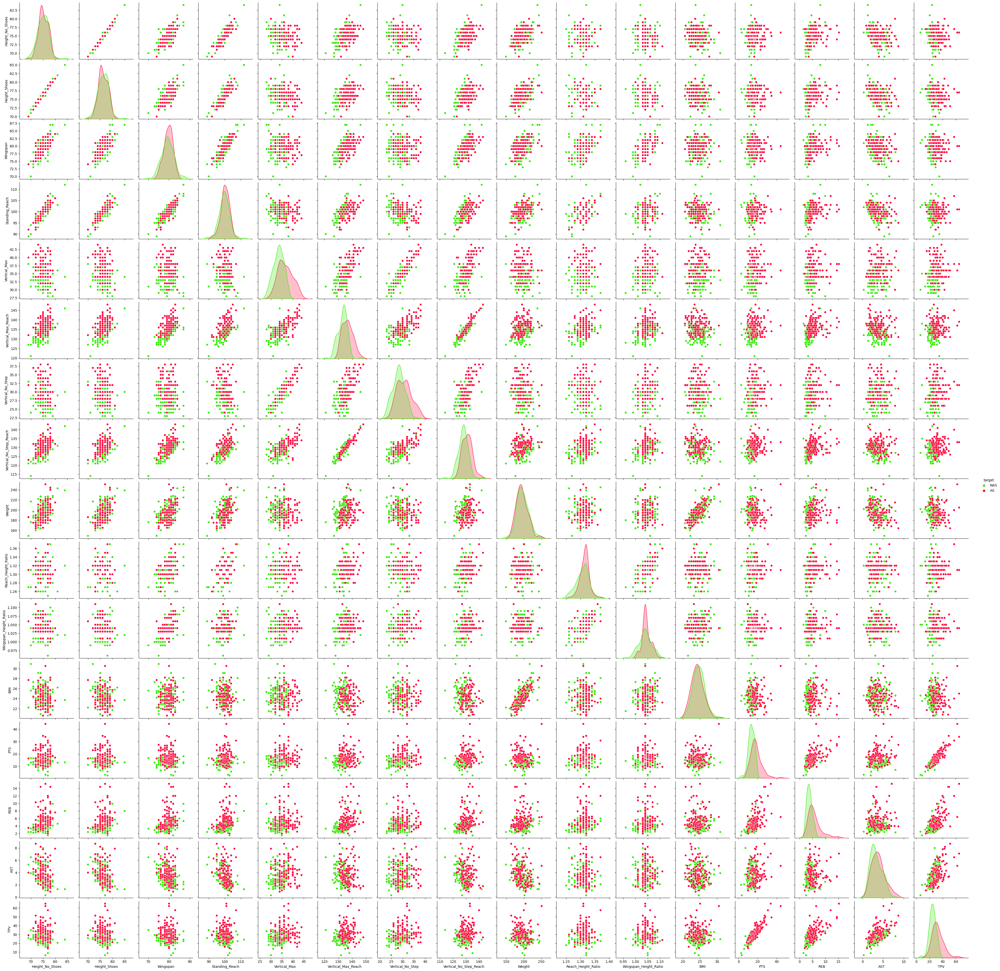

In [23]:
plots = sns.pairplot(df_bc.drop('All_Star', axis = 1), hue="target", palette='prism');

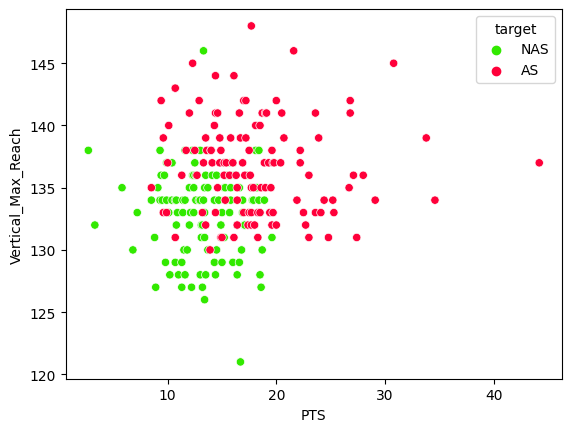

In [24]:
# choosing PTS and Vertical_Max_Reach

sns.scatterplot(x='PTS', y = 'Vertical_Max_Reach', data = df_bc, hue = 'target', palette='prism');

In [25]:
# Assigning PTS and Vertical_Max_Reach as features since distribution appears the most relevant

features = ['PTS', 'Vertical_Max_Reach']

In [26]:
X_feature = df_bc[features]

In [27]:
# Splitting the dataset and holding 20% of data for testing, test_size = 0.2

X_train, X_test, y_train, y_test= train_test_split(X_feature, y_target, test_size=0.2, random_state = 42)

In [28]:
log_model1 = LogisticRegression()
log_model1.fit(X_train, y_train)

LogisticRegression()

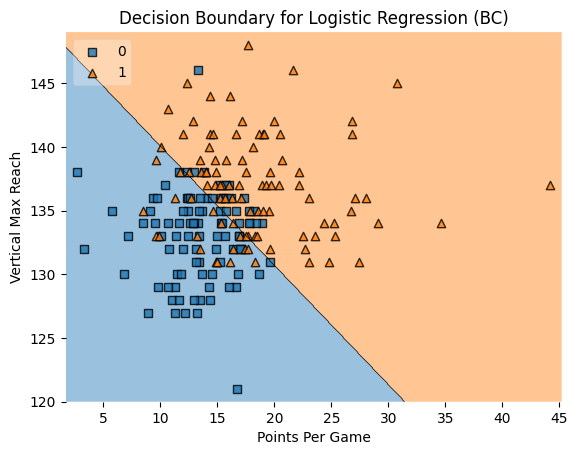

In [29]:
plot_decision_regions(X_train.values, y_train.values, clf=log_model1, legend=2)
plt.title("Decision Boundary for Logistic Regression (BC)")
plt.xlabel("Points Per Game")
plt.ylabel("Vertical Max Reach");

In [30]:
y_pred = log_model1.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Accuracy Score for Logistic Regression (BC):", round(accuracy * 100, 2), "%")
print("Precision Score for Logistic Regression (BC):", round(precision * 100, 2), "%")
print("Recall Score for Logistic Regression (BC):", round(recall * 100, 2), "%")
print("F1-Score for Logistic Regression (BC):", round(f1 * 100, 2), "%")

Accuracy Score for Logistic Regression (BC): 83.33 %
Precision Score for Logistic Regression (BC): 85.71 %
Recall Score for Logistic Regression (BC): 78.26 %
F1-Score for Logistic Regression (BC): 81.82 %


In [31]:
cm_log1 = cm(y_test, y_pred)
cm_log1

array([[22,  3],
       [ 5, 18]], dtype=int64)

Text(0.5, 1.0, 'Logistic Regression Confusion Matrix (BC)')

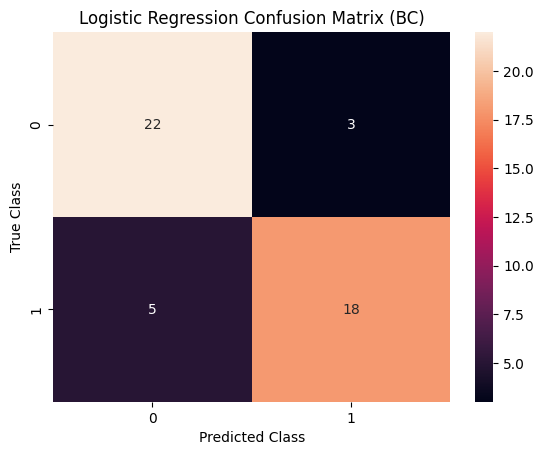

In [32]:
ax = plt.subplot()
sns.heatmap(cm_log1, annot=True, fmt = 'g', ax=ax)
ax.set_xlabel('Predicted Class')
ax.set_ylabel('True Class')
ax.set_title('Logistic Regression Confusion Matrix (BC)')

In [33]:
print((22/(22+3)), (18/(5+18)))

0.88 0.782608695652174


Result: The Logistic Regression model gets 88% of the non-All-Stars correct and 78.26% of the All-Stars correct when predicting for Backcourt players.

## Player Predictions (BC) - Logistic Regression

### Player 1
A player with a 10'10 maximum jumping vertical reach scoring an average of 8 points per game.

In [34]:
player1 = {
    'PTS': 8,
    'Vertical_Max_Reach': 130,
}

player1_df = pd.DataFrame([player1])
player1_df

,PTS,Vertical_Max_Reach
0,8,130


In [35]:
prediction_player1 = log_model1.predict(player1_df)

print('1 = All-Star')
print('0 = Not an All-Star')
print(f'For this player, the model predicts: {prediction_player1[0]}')

1 = All-Star
0 = Not an All-Star
For this player, the model predicts: 0


### Player 2
A player with a 11'8 maximum jumping vertical reach scoring an average of 22 points per game.

In [36]:
player2 = {
    'PTS': 22,
    'Vertical_Max_Reach': 140
}

player2_df = pd.DataFrame([player2])
player2_df

,PTS,Vertical_Max_Reach
0,22,140


In [37]:
prediction_player2 = log_model1.predict(player2_df)

print('1 = All-Star')
print('0 = Not an All-Star')
print(f'For this player, the model predicts: {prediction_player2[0]}')

1 = All-Star
0 = Not an All-Star
For this player, the model predicts: 1


## SVM (BC)

In [38]:
svm_model1 = SVC(kernel='linear', random_state=42)
svm_model1.fit(X_train, y_train)

SVC(kernel='linear', random_state=42)

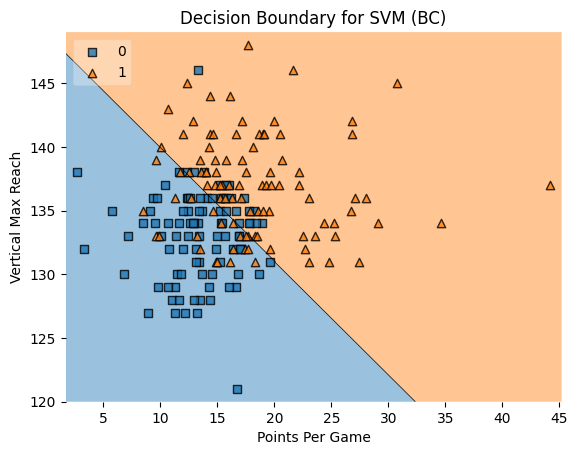

In [39]:
plot_decision_regions(X_train.values, y_train.values, clf=svm_model1, legend=2)
plt.title("Decision Boundary for SVM (BC)")
plt.xlabel("Points Per Game")
plt.ylabel("Vertical Max Reach");

In [40]:
y_pred = svm_model1.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Accuracy Score for SVM (BC):", round(accuracy * 100, 2), "%")
print("Precision Score for SVM (BC):", round(precision * 100, 2), "%")
print("Recall Score for SVM (BC):", round(recall * 100, 2), "%")
print("F1-Score for Logistic SVM (BC):", round(f1 * 100, 2), "%")

Accuracy Score for SVM (BC): 81.25 %
Precision Score for SVM (BC): 85.0 %
Recall Score for SVM (BC): 73.91 %
F1-Score for Logistic SVM (BC): 79.07 %


In [41]:
cm_svm1 = cm(y_test, y_pred)
cm_svm1

array([[22,  3],
       [ 6, 17]], dtype=int64)

Text(0.5, 1.0, 'SVM Confusion Matrix (BC)')

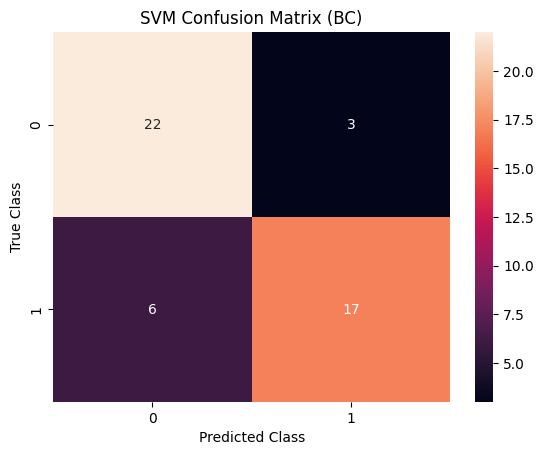

In [42]:
ax = plt.subplot()
sns.heatmap(cm_svm1, annot=True, fmt = 'g', ax=ax)
ax.set_xlabel('Predicted Class')
ax.set_ylabel('True Class')
ax.set_title('SVM Confusion Matrix (BC)')

In [43]:
print((22/(22+3)), (17/(6+17)))

0.88 0.7391304347826086


Result: The SVM model gets 88% of the non-All-Stars correct and 73.91% of the All-Stars correct when predicting for Backcourt players.

## Player Predictions (BC) - SVM

### Player 1
A player with a 10'10 maximum jumping vertical reach scoring an average of 8 points per game.

In [44]:
player1 = {
    'PTS': 8,
    'Vertical_Max_Reach': 130,
}

player1_df = pd.DataFrame([player1])
player1_df

,PTS,Vertical_Max_Reach
0,8,130


In [45]:
prediction_player1 = svm_model1.predict(player1_df)

print('1 = All-Star')
print('0 = Not an All-Star')
print(f'For this player, the model predicts: {prediction_player1[0]}')

1 = All-Star
0 = Not an All-Star
For this player, the model predicts: 0


### Player 2
A player with a 11'8 maximum jumping vertical reach scoring an average of 22 points per game.

In [46]:
player2 = {
    'PTS': 22,
    'Vertical_Max_Reach': 140
}

player2_df = pd.DataFrame([player2])
player2_df

,PTS,Vertical_Max_Reach
0,22,140


In [47]:
prediction_player2 = svm_model1.predict(player2_df)

print('1 = All-Star')
print('0 = Not an All-Star')
print(f'For this player, the model predicts: {prediction_player2[0]}')

1 = All-Star
0 = Not an All-Star
For this player, the model predicts: 1


## Models for Frontcourt Players

## Logistic Regression (FC)

In [48]:
y_target = df_fc['All_Star']

In [49]:
df_fc.columns.values

array(['All_Star', 'Height_No_Shoes', 'Height_Shoes', 'Wingspan',
       'Standing_Reach', 'Vertical_Max', 'Vertical_Max_Reach',
       'Vertical_No_Step', 'Vertical_No_Step_Reach', 'Weight',
       'Reach_Height_Ratio', 'Wingspan_Height_Ratio', 'BMI', 'PTS', 'REB',
       'AST', 'TPV'], dtype=object)

In [50]:
df_fc['target'] = df_fc['All_Star'].map({0:'NAS', 1:'AS'})

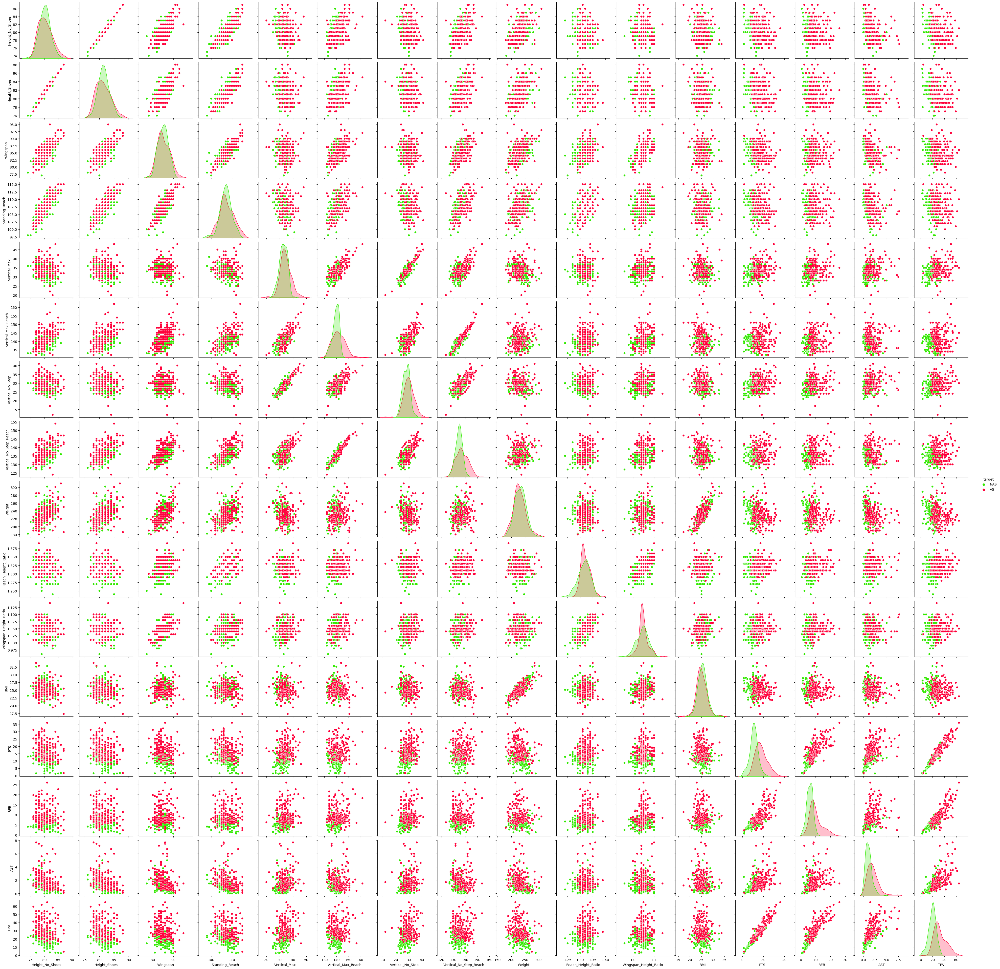

In [51]:
plots = sns.pairplot(df_fc.drop('All_Star', axis = 1), hue="target", palette='prism');

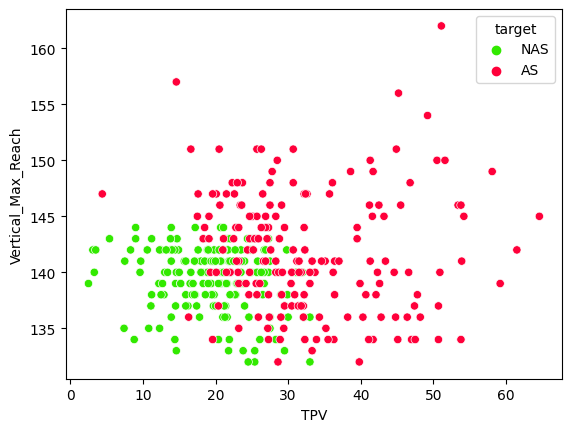

In [52]:
# choosing TPV and Vertical_Max_Reach

sns.scatterplot(x='TPV', y = 'Vertical_Max_Reach', data = df_fc, hue = 'target', palette='prism');

In [53]:
# Assigning TPV and Vertical_Max_Reach as features since distribution appears most relevant

features = ['TPV', 'Vertical_Max_Reach']

In [54]:
X_feature = df_fc[features]

In [55]:
# Splitting the dataset and holding 20% of data for testing, test_size = 0.2

X_train, X_test, y_train, y_test= train_test_split(X_feature, y_target, test_size=0.2, random_state = 42)

In [56]:
log_model2 = LogisticRegression()
log_model2.fit(X_train, y_train)

LogisticRegression()

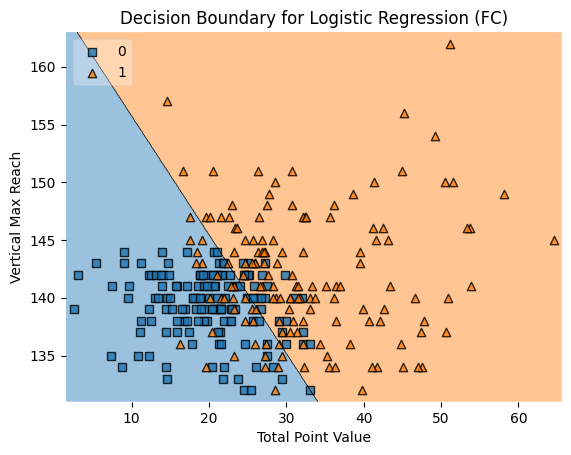

In [57]:
plot_decision_regions(X_train.values, y_train.values, clf=log_model2, legend=2)
plt.title("Decision Boundary for Logistic Regression (FC)")
plt.xlabel("Total Point Value")
plt.ylabel("Vertical Max Reach");

In [58]:
y_pred = log_model2.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Accuracy Score for Logistic Regression (FC):", round(accuracy * 100, 2), "%")
print("Precision Score for Logistic Regression (FC):", round(precision * 100, 2), "%")
print("Recall Score for Logistic Regression (FC):", round(recall * 100, 2), "%")
print("F1-Score for Logistic Regression (FC):", round(f1 * 100, 2), "%")

Accuracy Score for Logistic Regression (FC): 87.84 %
Precision Score for Logistic Regression (FC): 88.89 %
Recall Score for Logistic Regression (FC): 86.49 %
F1-Score for Logistic Regression (FC): 87.67 %


In [59]:
cm_log2 = cm(y_test, y_pred)
cm_log2

array([[33,  4],
       [ 5, 32]], dtype=int64)

Text(0.5, 1.0, 'Logistic Regression Confusion Matrix (FC)')

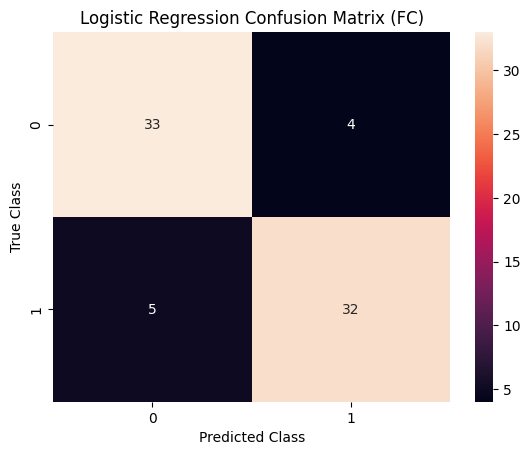

In [60]:
ax = plt.subplot()
sns.heatmap(cm_log2, annot=True, fmt = 'g', ax=ax)
ax.set_xlabel('Predicted Class')
ax.set_ylabel('True Class')
ax.set_title('Logistic Regression Confusion Matrix (FC)')

In [61]:
print(33/(33+4), 32/(5+32))

0.8918918918918919 0.8648648648648649


Result: The Logistic Regression model gets 89.19% of the non-All-Stars correct and 86.49% of the All-Stars correct when predicting for Frontcourt players.

## Player Predictions (FC) - Logistic Regression

### Player 3
A player with an 11'9 maximum jumping vertical reach and a total point value of 24.4 per game.

In [62]:
player3 = {
    'TPV': 24.4,
    'Vertical_Max_Reach': 141
}

player3_df = pd.DataFrame([player3])
player3_df

,TPV,Vertical_Max_Reach
0,24.4,141


In [63]:
prediction_player3 = log_model2.predict(player3_df)

print('1 = All-Star')
print('0 = Not an All-Star')
print(f'For this player, the model predicts: {prediction_player3[0]}')

1 = All-Star
0 = Not an All-Star
For this player, the model predicts: 1


### Player 4
A player with an 12'3 maximum jumping vertical reach and a total point value of 34 per game.

In [64]:
player4 = {
    'TPV': 34,
    'Vertical_Max_Reach': 147
}

player4_df = pd.DataFrame([player4])
player4_df

,TPV,Vertical_Max_Reach
0,34,147


In [65]:
prediction_player4 = log_model2.predict(player4_df)

print('1 = All-Star')
print('0 = Not an All-Star')
print(f'For this player, the model predicts: {prediction_player4[0]}')

1 = All-Star
0 = Not an All-Star
For this player, the model predicts: 1


## SVM (FC)

In [66]:
svm_model2 = SVC(kernel='linear', random_state=42)
svm_model2.fit(X_train, y_train)

SVC(kernel='linear', random_state=42)

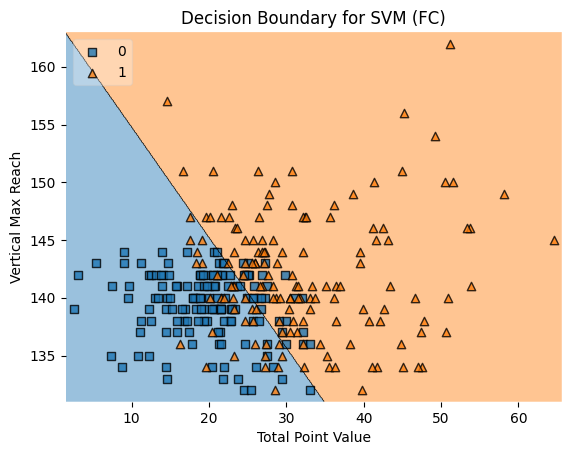

In [67]:
plot_decision_regions(X_train.values, y_train.values, clf=svm_model2, legend=2)
plt.title("Decision Boundary for SVM (FC)")
plt.xlabel("Total Point Value")
plt.ylabel("Vertical Max Reach");

In [68]:
y_pred = svm_model2.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Accuracy Score for SVM (FC):", round(accuracy * 100, 2), "%")
print("Precision Score for SVM (FC):", round(precision * 100, 2), "%")
print("Recall Score for SVM (FC):", round(recall * 100, 2), "%")
print("F1-Score for Logistic SVM (FC):", round(f1 * 100, 2), "%")

Accuracy Score for SVM (FC): 86.49 %
Precision Score for SVM (FC): 88.57 %
Recall Score for SVM (FC): 83.78 %
F1-Score for Logistic SVM (FC): 86.11 %


In [69]:
cm_svm2 = cm(y_test, y_pred)
cm_svm2

array([[33,  4],
       [ 6, 31]], dtype=int64)

Text(0.5, 1.0, 'SVM Confusion Matrix (FC)')

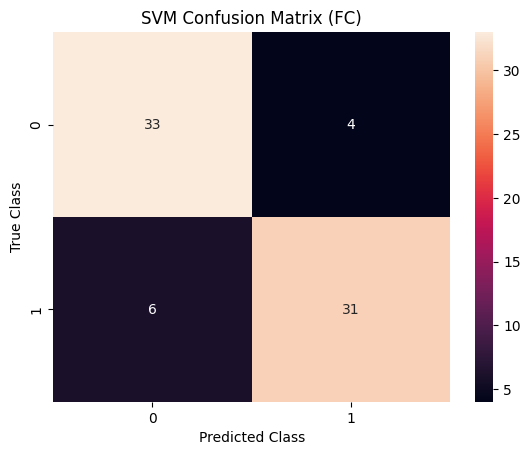

In [70]:
ax = plt.subplot()
sns.heatmap(cm_svm2, annot=True, fmt = 'g', ax=ax)
ax.set_xlabel('Predicted Class')
ax.set_ylabel('True Class')
ax.set_title('SVM Confusion Matrix (FC)')

In [71]:
print(33/(33+4), 31/(6+31))

0.8918918918918919 0.8378378378378378


Result: The SVM model gets 89.19% of the non-All-Stars correct and 83.78% of the All-Stars correct when predicting for Frontcourt players.

## Player Predictions (FC) - SVM

### Player 3
A player with an 11'9 maximum jumping vertical reach and a total point value of 24.4 per game.

In [72]:
player3 = {
    'TPV': 24.4,
    'Vertical_Max_Reach': 141
}

player3_df = pd.DataFrame([player3])
player3_df

,TPV,Vertical_Max_Reach
0,24.4,141


In [73]:
prediction_player3 = svm_model2.predict(player3_df)

print('1 = All-Star')
print('0 = Not an All-Star')
print(f'For this player, the model predicts: {prediction_player3[0]}')

1 = All-Star
0 = Not an All-Star
For this player, the model predicts: 0


### Player 4
A player with an 12'3 maximum jumping vertical reach and a total point value of 34 per game.

In [74]:
player4 = {
    'TPV': 34,
    'Vertical_Max_Reach': 147
}

player4_df = pd.DataFrame([player4])
player4_df

,TPV,Vertical_Max_Reach
0,34,147


In [75]:
prediction_player4 = log_model2.predict(player4_df)

print('1 = All-Star')
print('0 = Not an All-Star')
print(f'For this player, the model predicts: {prediction_player4[0]}')

1 = All-Star
0 = Not an All-Star
For this player, the model predicts: 1


## Conclusions

For Logistic Regression and SVM, models made to make predictions for Frontcourt players had a higher level of accuracy than those made for Backcourt players. This indicating that the qualities that make an All-Star at the Small Forward, Power Forward, and Center (Frontcourt) positions are easier for these models to predict from our particular dataset than those that make an All-Star Point Guard or Shooting Guard (Backcourt) when less features are involved.

That said, however, even though the models are capable of making predictions to a certain level of accuracy, as they are based on a very limited range of features (only two each) when compared to the number of features throughout the entire dataset, these predictions may not paint the full picture.

For this reason, other models such as Random Forest and XGBoost that implement the full features of the dataset are leveraged in this project in the other notebooks for a more comprehensive approach and to determine which predictions for players 1-4 are consistent/differ between models that learn from more features to those that learn from less.